In [1]:
!pip install ultralytics
!pip install Pillow



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.1/874.1 kB 35.6 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import torch
from google.colab import drive
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import shutil


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Drive

In [3]:
drive.mount('/content/drive')


Mounted at /content/drive


GPU


In [4]:
print(torch.cuda.is_available())


True


### Copie du dataset sur le content

In [5]:
!cp /content/drive/MyDrive/dataset/Fire_smoke_detectionyv8_plus.zip /content/Fire_smoke_detectionyv8_plus.zip


In [6]:
!unzip /content/Fire_smoke_detectionyv8_plus.zip -d /content/


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1320-_jpg.rf.df04efbcac4e3675e66c8d7326b75474.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1326-_jpg.rf.d94f054bf2d00b92bee5f5cae06e0c76.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1327-_jpg.rf.48c5a65ad74471d4fb579b63a9cdc4f3.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1329-_jpg.rf.2cb5500c1e5f87c2c9fd7390e1032f50.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1330-_jpg.rf.a8266c5a320954749c77866aff00a7e6.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1332-_jpg.rf.e75e06204b1db5dfb300b0be461b3247.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/train/labels/middle_-1343-_jpg.rf.5b75a67a7af64cb1e6b6c790db309217.txt  
  inflating: /content/Fire_smoke_detectionyv8_plus/tra

In [7]:
local_dataset_path = '/content/Fire_smoke_detectionyv8_plus'
data_file_path = '/content/Fire_smoke_detectionyv8_plus/data.yaml'

### Anaylse des images

In [8]:
# Chemins vers les dossiers d'images
train_images_path = '/content/Fire_smoke_detectionyv8_plus/train/images'
train_labels_path = '/content/Fire_smoke_detectionyv8_plus/train/labels'
val_images_path = '/content/Fire_smoke_detectionyv8_plus/valid/images'

def get_image_sizes(image_folder):
    sizes = []
    for filename in os.listdir(image_folder):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):
            image_path = os.path.join(image_folder, filename)
            try:
                with Image.open(image_path) as img:
                    sizes.append(img.size)  # (largeur, hauteur)
            except Exception as e:
                print(f'Erreur lors de l\'ouverture de {filename}: {e}')
    return sizes


In [9]:
# Obtenir les tailles des images d'entraînement et de validation
train_sizes = get_image_sizes(train_images_path)
val_sizes = get_image_sizes(val_images_path)

# Combiner les tailles des deux ensembles
all_sizes = train_sizes + val_sizes


In [10]:
# Extraire les largeurs et hauteurs
widths = [size[0] for size in all_sizes]
heights = [size[1] for size in all_sizes]

# Calculer les statistiques
max_width = max(widths)
max_height = max(heights)
min_width = min(widths)
min_height = min(heights)
avg_width = sum(widths) / len(widths)
avg_height = sum(heights) / len(heights)

print(f'Largeur maximale : {max_width}')
print(f'Hauteur maximale : {max_height}')
print(f'Largeur minimale : {min_width}')
print(f'Hauteur minimale : {min_height}')
print(f'Largeur moyenne : {avg_width:.2f}')
print(f'Hauteur moyenne : {avg_height:.2f}')


Largeur maximale : 640
Hauteur maximale : 640
Largeur minimale : 640
Hauteur minimale : 480
Largeur moyenne : 640.00
Hauteur moyenne : 600.67


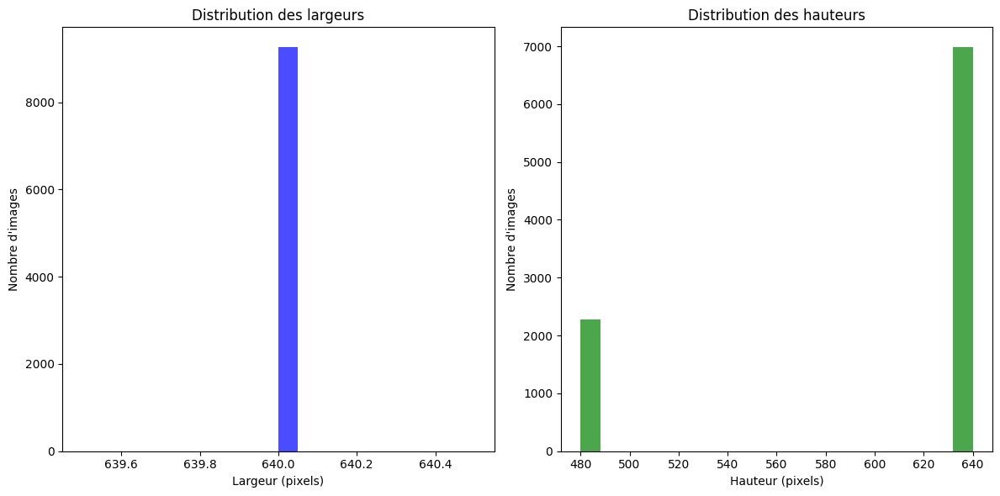

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Histogramme des largeurs
plt.subplot(1, 2, 1)
plt.hist(widths, bins=20, color='blue', alpha=0.7)
plt.title('Distribution des largeurs')
plt.xlabel('Largeur (pixels)')
plt.ylabel('Nombre d\'images')

# Histogramme des hauteurs
plt.subplot(1, 2, 2)
plt.hist(heights, bins=20, color='green', alpha=0.7)
plt.title('Distribution des hauteurs')
plt.xlabel('Hauteur (pixels)')
plt.ylabel('Nombre d\'images')

plt.tight_layout()
plt.show()


Annotation

In [12]:
def display_image_with_boxes(images_path, annotation_path, class_names):
    for filename in os.listdir(images_path)[:5]:

      image_path = os.path.join(images_path, filename)
      annotation = os.path.join(annotation_path, filename.replace('.jpg', '.txt'))
      print(image_path)
      image = cv2.imread(image_path)
      height, width, _ = image.shape

      with open(annotation, 'r') as f:
          lines = f.readlines()


      for line in lines:
          class_id, x_center, y_center, w, h = map(float, line.strip().split())
          x_center *= width
          y_center *= height
          w *= width
          h *= height

          x1 = int(x_center - w / 2)
          y1 = int(y_center - h / 2)
          x2 = int(x_center + w / 2)
          y2 = int(y_center + h / 2)

          label = class_names[int(class_id)]
          cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
          cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                      0.9, (36,255,12), 2)

      plt.figure(figsize=(10, 10))
      plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      plt.axis('off')
      plt.show()


/content/Fire_smoke_detectionyv8_plus/train/images/frame_0758_jpg.rf.c626b0de6cc51fe920316f359cc91caf.jpg


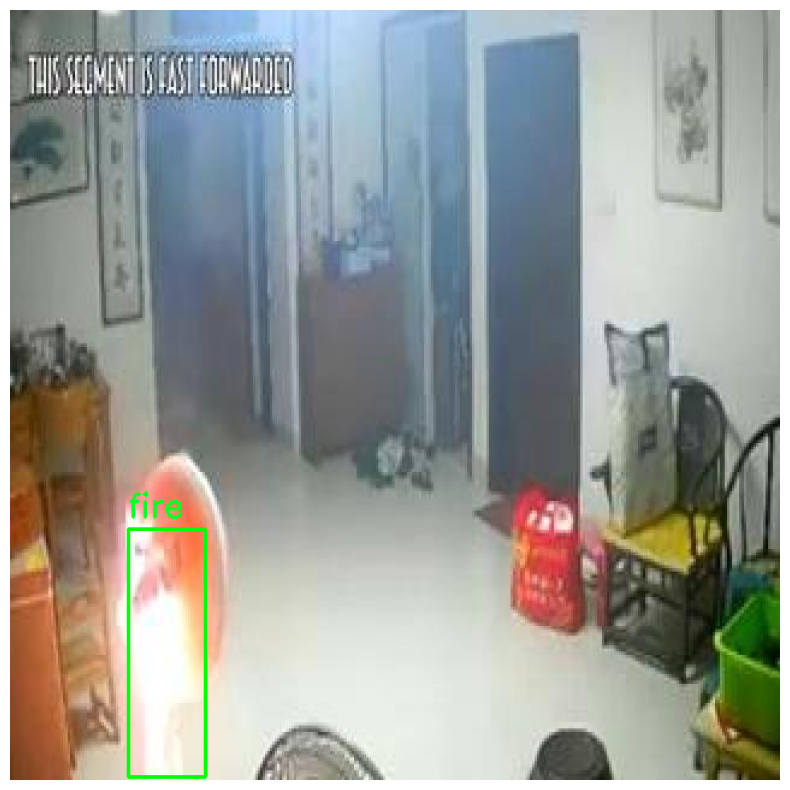

/content/Fire_smoke_detectionyv8_plus/train/images/ck0m1m206hgy907944qxlvo5i_jpeg_jpg.rf.6d3b7d4b83909ae8baeee2a755673de0.jpg


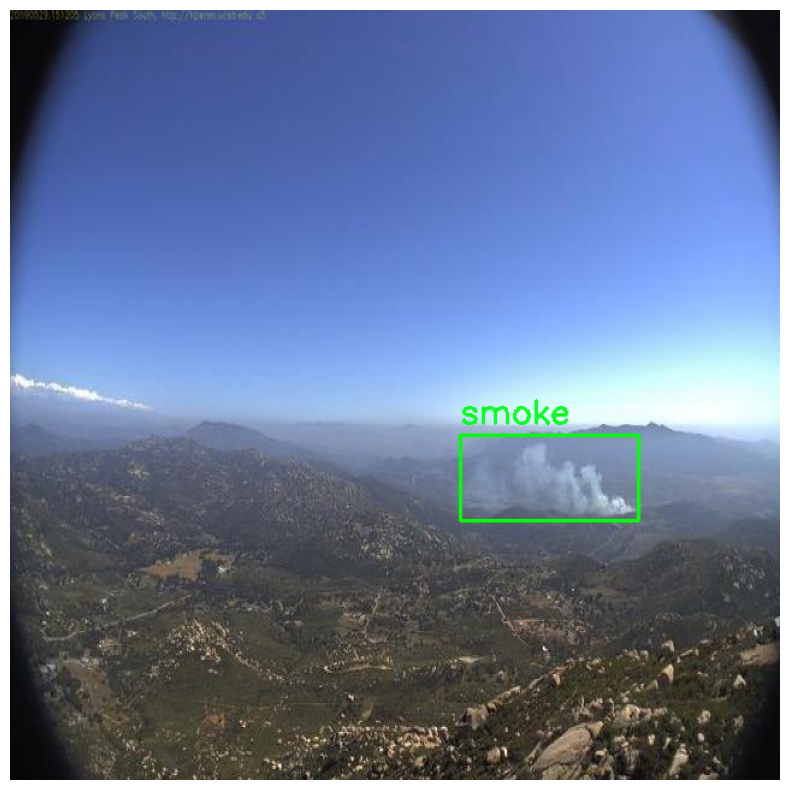

/content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.8ed4abc825bdd3a7592414aa26118b85.jpg


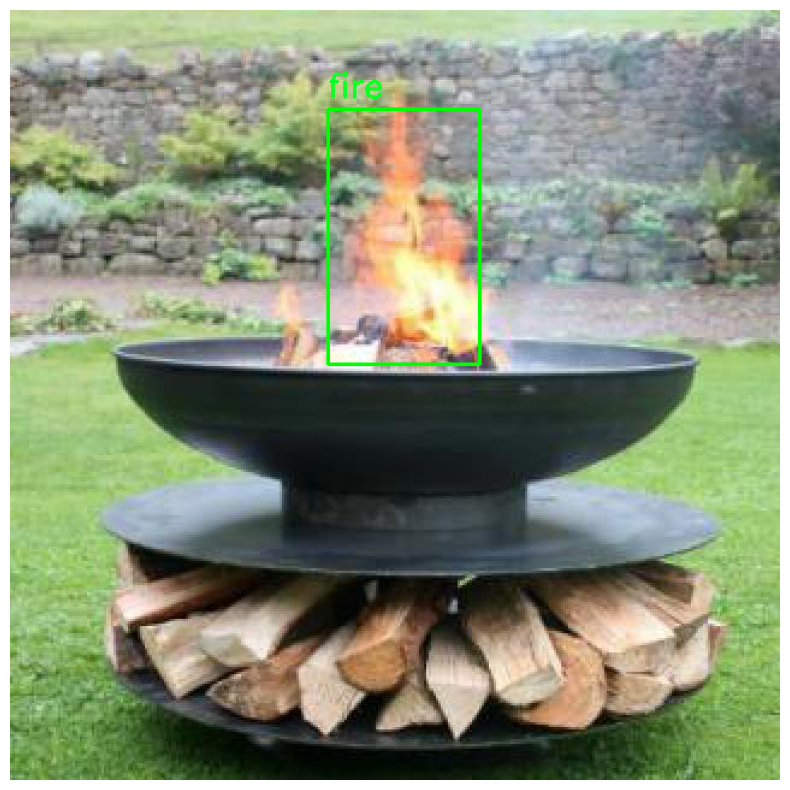

/content/Fire_smoke_detectionyv8_plus/train/images/large_-335-_jpg.rf.45cb29fdde249bcfea9cc5a1e41d9b71.jpg


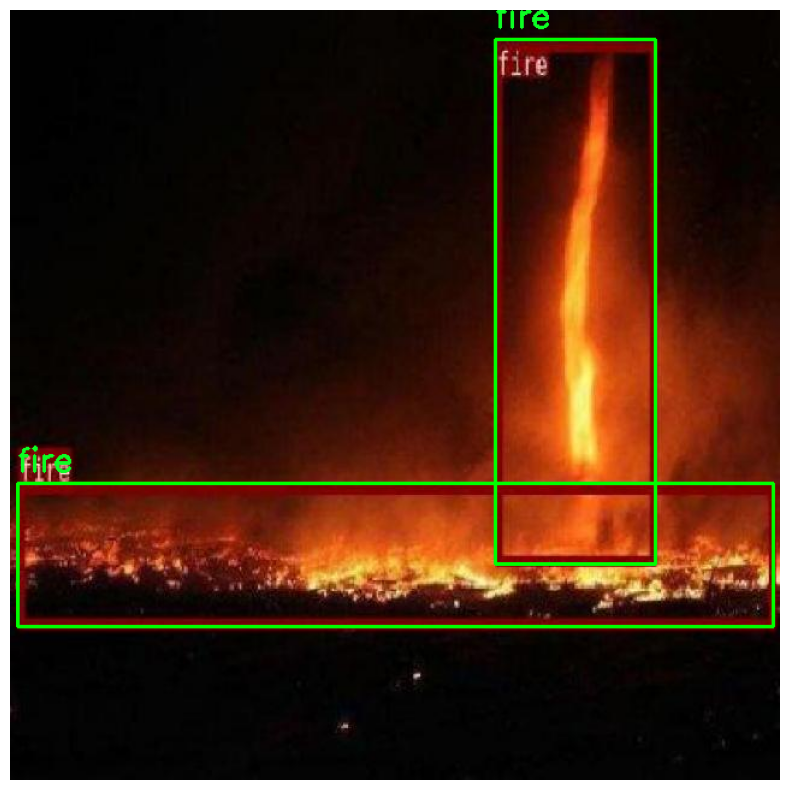

/content/Fire_smoke_detectionyv8_plus/train/images/48_jpg.rf.b1cc5351d2a57b8f5bc9eff4653afb48.jpg


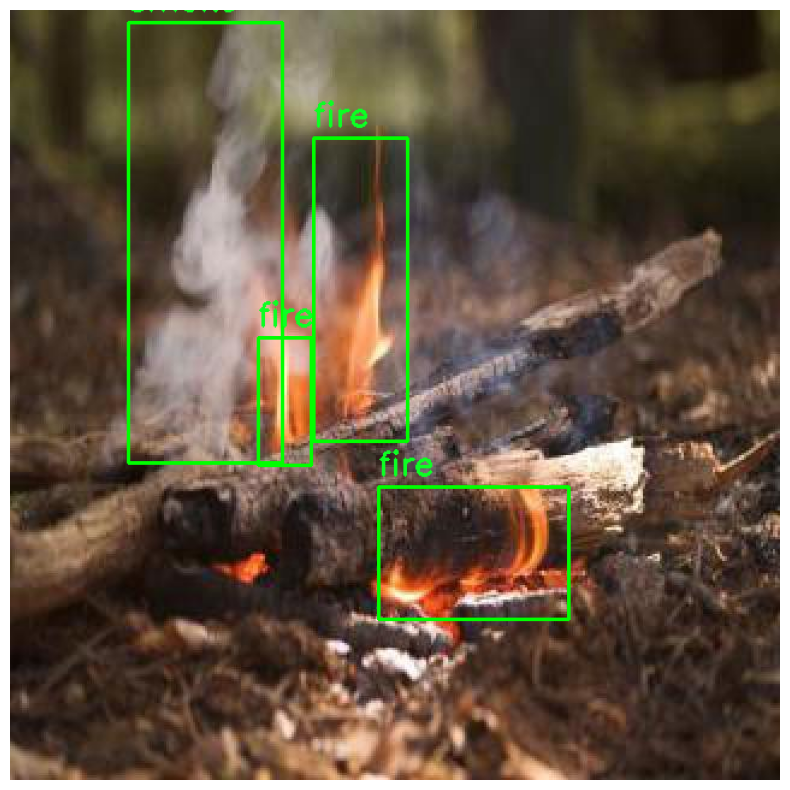

In [13]:
class_names = ['fire', 'smoke']
display_image_with_boxes(train_images_path, train_labels_path, class_names)


Distribution des classes

In [14]:
from collections import Counter
import glob
def get_class_distribution(annotation_dir, class_names):
    class_counts = Counter()
    for txt_file in glob.glob(os.path.join(annotation_dir, '*.txt')):
        with open(txt_file, 'r') as f:
            lines = f.readlines()
        for line in lines:
            class_id = int(line.strip().split()[0])
            class_counts[class_names[class_id]] += 1
    return class_counts




Images en doubles

In [15]:
!pip install imagehash pillow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 107.8 MB/s eta 0:00:00


In [16]:
import os
import glob
from PIL import Image
import imagehash

def find_duplicate_images_by_phash(image_dir, hash_func=imagehash.phash, hash_size=16):
    """
    Trouve les images en double dans un répertoire en utilisant le hachage perceptuel.

    :param image_dir: Chemin vers le dossier contenant les images
    :param hash_func: Fonction de hachage à utiliser (par défaut phash)
    :param hash_size: Taille du hachage (plus grande pour plus de précision)
    :return: Dictionnaire avec les hachages comme clés et les listes de fichiers correspondants comme valeurs
    """
    hashes = {}
    image_files = glob.glob(os.path.join(image_dir, '*.*'))

    for image_file in image_files:
        try:
            with Image.open(image_file) as img:
                # Calculer le hachage perceptuel de l'image
                img_hash = hash_func(img, hash_size=hash_size)
            # Convertir le hachage en chaîne de caractères pour l'utiliser comme clé
            hash_str = str(img_hash)

            if hash_str in hashes:
                hashes[hash_str].append(image_file)
            else:
                hashes[hash_str] = [image_file]
        except Exception as e:
            print(f"Erreur lors du traitement de {image_file}: {e}")

    # Filtrer les hachages qui ont plus d'un fichier associé (donc des doublons)
    duplicates = {hash_str: file_list for hash_str, file_list in hashes.items() if len(file_list) > 1}
    return duplicates

def delete_duplicate_images_by_phash(duplicates, annotation_dir=None):
    """
    Supprime les images en double et leurs annotations correspondantes.

    :param duplicates: Dictionnaire avec les hachages comme clés et les listes de fichiers correspondants comme valeurs
    :param annotation_dir: Chemin vers le dossier des annotations (optionnel)
    """
    for hash_str, file_list in duplicates.items():
        # Garder un fichier et supprimer les autres
        files_to_delete = file_list[1:]  # Conserver le premier fichier, supprimer les suivants
        for file_to_delete in files_to_delete:
            try:
                os.remove(file_to_delete)
                print(f"Image en double supprimée : {file_to_delete}")

                if annotation_dir:
                    base_name = os.path.basename(file_to_delete)
                    name, _ = os.path.splitext(base_name)
                    annotation_file = os.path.join(annotation_dir, f"{name}.txt")
                    if os.path.exists(annotation_file):
                        os.remove(annotation_file)
                        print(f"Annotation supprimée : {annotation_file}")
            except Exception as e:
                print(f"Erreur lors de la suppression de {file_to_delete}: {e}")




In [17]:

# Trouver les images en double
duplicates = find_duplicate_images_by_phash(train_images_path)

if duplicates:
    total_duplicates = sum(len(files) - 1 for files in duplicates.values())
    print(f"Nombre d'images en double trouvées : {total_duplicates}")
    for hash_str, file_list in duplicates.items():
        print(f"Doublons pour le hachage {hash_str}:")
        for file in file_list:
            print(f" - {file}")

    # Supprimer les images en double et leurs annotations
    delete_duplicate_images_by_phash(duplicates, annotation_dir=train_labels_path)
else:
    print("Aucun doublon d'image trouvé.")

Nombre d'images en double trouvées : 734
Doublons pour le hachage bc13d1c99660608c6a738e2de1b281ca781d96f3e1ec7833b7cc66978b61e59c:
 - /content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.8ed4abc825bdd3a7592414aa26118b85.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.c4e97e93b828a6ba1e735f8e0b044023.jpg
Doublons pour le hachage f864efac0079ccc667dd341067b8ec974cc4ee7e5cc667197080ccf750046cf3:
 - /content/Fire_smoke_detectionyv8_plus/train/images/large_-936-_jpg.rf.d16613612abf35e7789fdf76a666b025.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/large_-936-_jpg.rf.922790c6c914fe15cc45e6d4f16ee4cd.jpg
Doublons pour le hachage c014b96800577f29d1d794290ff633a9c6fab90536ea4d95f22a8cd537295cd6:
 - /content/Fire_smoke_detectionyv8_plus/train/images/ckau2kdcuyf190753m6zrjztp_jpeg.rf.2b430e81e9afe3d3153eb37ddaaa6a67.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/ckau2sxhxyiw90744izbgfkza_jpeg.rf.4464fd18efd9762becf3fe2f845b2cbf.jpg
 -

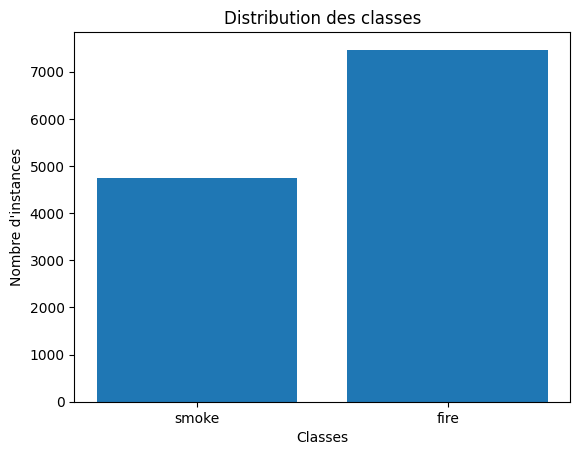

In [18]:
class_counts = get_class_distribution(train_labels_path, class_names)
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Distribution des classes')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'instances')
plt.show()

Images floues

In [19]:
def detect_blurry_images(image_dir, threshold=100.0):
    blurry_images = []
    for image_file in glob.glob(os.path.join(image_dir, '*.*')):
        image = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Impossible de lire l'image {image_file}")
            continue
        laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
        if laplacian_var < threshold:
            blurry_images.append((image_file, laplacian_var))

    if blurry_images:
        print(len(blurry_images))
        for img, var in blurry_images[:2]:
          image = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
          plt.figure(figsize=(10, 10))
          plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
          plt.axis('off')
          plt.show()

    else:
        print("Aucune image floue détectée.")



722


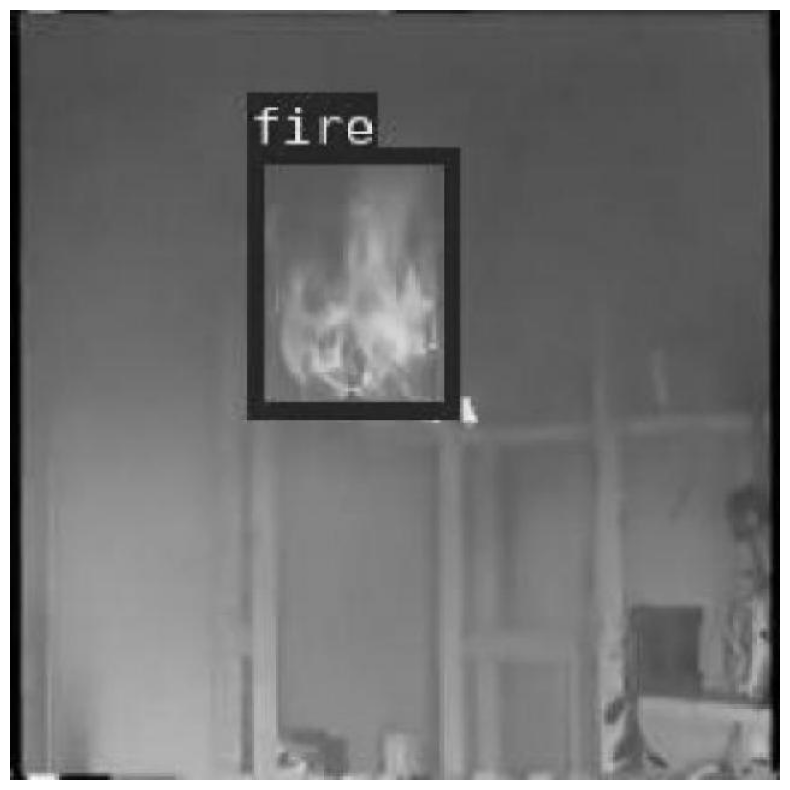

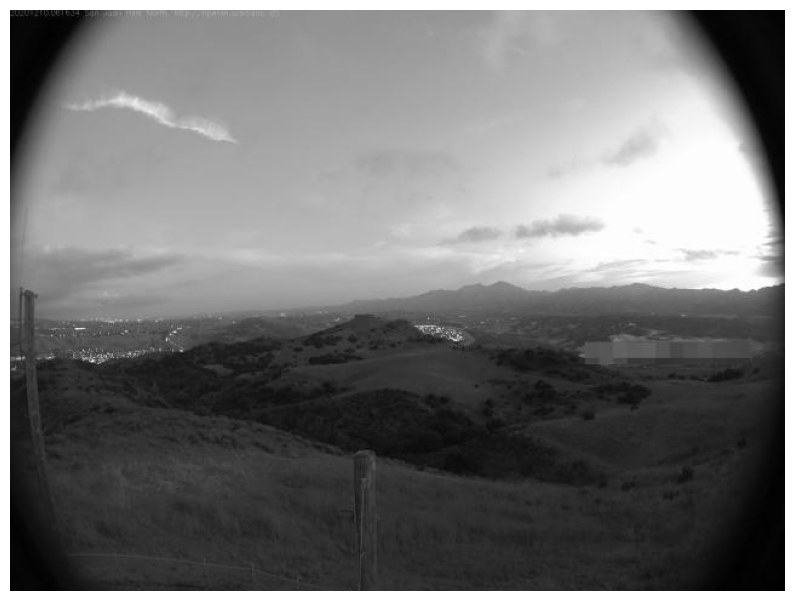

In [20]:
detect_blurry_images(train_images_path)

### MODEL

In [21]:
model_name = "yolov8n"
model = YOLO(f'{model_name}.pt')


100%|██████████| 6.25M/6.25M [00:00<00:00, 386MB/s]


### TRAIN

In [22]:
import datetime
date = datetime.datetime.now()
date_str = str(date)[:10]

In [23]:

epochs = 100
batch = 16
imgsz = 640
name = f"{model_name}_{epochs}_{batch}_{imgsz}_{date_str}_enhanced"
results_dir = '/content/runs/detect/train'


names:
  0: feu
  1: fumée
weights:
  feu: 1.0
  fumée: 1.5

In [28]:
model.train(data=data_file_path,epochs= epochs,batch= batch, imgsz =imgsz,name =name,project =results_dir,weight_decay=0.01,lr0=0.001 ,optimizer='AdamW')


Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Fire_smoke_detectionyv8_plus/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/runs/detect/train, name=yolov8n_100_16_640_2024-09-25_enhanced, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=F

100%|██████████| 22.2M/22.2M [00:00<00:00, 44.6MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/Fire_smoke_detectionyv8_plus/train/labels... 6921 images, 237 backgrounds, 0 corrupt: 100%|██████████| 6921/6921 [00:05<00:00, 1183.58it/s]


train: New cache created: /content/Fire_smoke_detectionyv8_plus/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/Fire_smoke_detectionyv8_plus/valid/labels... 1601 images, 67 backgrounds, 0 corrupt: 100%|██████████| 1601/1601 [00:01<00:00, 1048.76it/s]


val: New cache created: /content/Fire_smoke_detectionyv8_plus/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 12, len(boxes) = 2706. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.01), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.52G      1.709      3.832      1.667         38        640:   2%|▏         | 9/433 [00:02<01:23,  5.05it/s]

      1/100      2.52G      1.702        3.7      1.682         56        640:   4%|▍         | 17/433 [00:04<01:06,  6.25it/s]
100%|██████████| 755k/755k [00:00<00:00, 82.1MB/s]
      1/100      2.55G      1.476      2.096      1.553         31        640: 100%|██████████| 433/433 [01:07<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.16it/s]

                   all       1601       2706      0.625      0.358      0.385      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.18G      1.381      1.605      1.485         16        640: 100%|██████████| 433/433 [01:04<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.89it/s]


                   all       1601       2706      0.587      0.418      0.453      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.22G      1.349      1.506      1.459         28        640: 100%|██████████| 433/433 [01:04<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.65it/s]


                   all       1601       2706      0.616      0.457      0.483      0.296

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.18G      1.322      1.454      1.448         28        640: 100%|██████████| 433/433 [01:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.93it/s]

                   all       1601       2706       0.69      0.486      0.547      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.23G       1.29      1.384      1.415         23        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.92it/s]

                   all       1601       2706      0.686      0.446      0.502      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.17G      1.246      1.312      1.395         17        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.93it/s]


                   all       1601       2706      0.694        0.5      0.565       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.17G      1.224      1.278      1.378         21        640: 100%|██████████| 433/433 [01:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.91it/s]

                   all       1601       2706      0.725      0.538      0.599      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.22G      1.206      1.246       1.36         27        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.87it/s]

                   all       1601       2706      0.722      0.565       0.62      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.19G      1.214      1.225      1.364         33        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.89it/s]

                   all       1601       2706      0.734      0.561      0.621        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.18G      1.195      1.205      1.364         29        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.91it/s]

                   all       1601       2706      0.729       0.55      0.613      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.19G      1.182      1.178      1.347         42        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.93it/s]

                   all       1601       2706      0.739      0.559      0.607      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.21G      1.187      1.181      1.345         34        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.88it/s]

                   all       1601       2706      0.772       0.57      0.639      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.19G      1.167      1.144       1.33         32        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.01it/s]

                   all       1601       2706      0.756      0.565      0.637      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.18G       1.16      1.134       1.33         35        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.89it/s]

                   all       1601       2706       0.79      0.584      0.654      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.19G      1.143      1.123      1.321         37        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.97it/s]

                   all       1601       2706      0.773      0.574      0.651      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.19G      1.137      1.102      1.321         26        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.85it/s]

                   all       1601       2706      0.766       0.59      0.655      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.19G      1.123      1.081      1.308         32        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.00it/s]

                   all       1601       2706      0.781      0.592      0.663      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.17G      1.126      1.081      1.313         27        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.94it/s]

                   all       1601       2706      0.779      0.608      0.677      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.17G      1.118       1.06      1.305         41        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.93it/s]

                   all       1601       2706      0.782      0.616      0.682      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.19G      1.102      1.048      1.292         24        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.93it/s]

                   all       1601       2706      0.761      0.615      0.676      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.17G      1.102      1.034      1.293         31        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.08it/s]

                   all       1601       2706       0.78      0.597      0.675      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.18G       1.11      1.056      1.298         23        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.94it/s]

                   all       1601       2706      0.792      0.596      0.672       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.19G      1.082       1.02      1.284         19        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.92it/s]

                   all       1601       2706      0.793      0.606      0.684      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.19G      1.104      1.049      1.296         33        640: 100%|██████████| 433/433 [01:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.95it/s]

                   all       1601       2706      0.797      0.622      0.693       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.22G      1.085       1.01      1.277         27        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.94it/s]

                   all       1601       2706      0.791      0.616      0.684      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.18G      1.074     0.9977      1.279         23        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.92it/s]

                   all       1601       2706      0.797      0.638      0.697      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.19G      1.069      0.997      1.275          8        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.96it/s]

                   all       1601       2706      0.797      0.618      0.694       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.21G      1.071     0.9913      1.275         35        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706        0.8      0.624      0.695      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.19G      1.065     0.9789      1.266         28        640: 100%|██████████| 433/433 [01:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.97it/s]

                   all       1601       2706      0.785      0.629      0.704      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.16G      1.068     0.9705      1.269         15        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.91it/s]

                   all       1601       2706      0.785      0.656      0.711      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.17G      1.039     0.9516      1.256         25        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.00it/s]

                   all       1601       2706      0.809       0.64      0.709      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.18G      1.041     0.9485      1.261         47        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706        0.8      0.633      0.705      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.17G       1.04      0.947      1.255         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.96it/s]

                   all       1601       2706      0.794      0.644       0.71      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       2.2G      1.051     0.9546      1.267         25        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.97it/s]

                   all       1601       2706        0.8      0.634      0.707      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.19G      1.025     0.9268      1.247         25        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.08it/s]

                   all       1601       2706        0.8      0.652      0.716      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.19G      1.044     0.9456      1.255         15        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.96it/s]

                   all       1601       2706      0.829      0.633      0.723      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.17G       1.02     0.9194      1.237         45        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.99it/s]

                   all       1601       2706      0.812      0.649      0.723       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.16G      1.027     0.9139      1.244         29        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706       0.81      0.661      0.725      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.17G      1.014     0.9087      1.236         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.13it/s]

                   all       1601       2706      0.814      0.655      0.729      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       2.2G      1.018     0.8964      1.233         19        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.796      0.657      0.726      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.21G      1.015     0.8988      1.232         21        640: 100%|██████████| 433/433 [01:03<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.06it/s]

                   all       1601       2706      0.797      0.667      0.729      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.17G      1.032     0.9127      1.248         36        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.16it/s]

                   all       1601       2706      0.808      0.658      0.732      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.19G      1.001     0.8883      1.231         35        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.04it/s]

                   all       1601       2706      0.806      0.662      0.731      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.19G      1.014     0.8939      1.236         22        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706      0.834      0.656      0.738      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.19G     0.9887     0.8789      1.225         22        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.05it/s]

                   all       1601       2706      0.823      0.654      0.737        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.17G      1.009     0.8822      1.238         34        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.16it/s]

                   all       1601       2706       0.84       0.66      0.738      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.18G     0.9968     0.8725      1.221         24        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706       0.82      0.673      0.741      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.17G     0.9867     0.8623      1.221         23        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706      0.834      0.666      0.741      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.19G     0.9966     0.8572       1.22         21        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.23it/s]

                   all       1601       2706      0.812      0.682      0.743      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.17G      0.987     0.8566      1.215         30        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.10it/s]

                   all       1601       2706      0.823      0.668      0.739      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.17G      0.983     0.8403       1.21         26        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.13it/s]

                   all       1601       2706      0.808      0.682      0.744      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.19G     0.9831     0.8323      1.213         29        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.16it/s]

                   all       1601       2706      0.813      0.692      0.752      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.19G     0.9733     0.8314      1.204         15        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.18it/s]

                   all       1601       2706      0.828      0.683      0.751      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.18G     0.9636       0.82      1.199         28        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.11it/s]

                   all       1601       2706      0.831      0.678      0.748       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.19G     0.9878     0.8471      1.215         23        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.07it/s]

                   all       1601       2706      0.821      0.678      0.748      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.17G     0.9522     0.8181      1.197         19        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.16it/s]

                   all       1601       2706      0.826      0.687      0.756      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.18G     0.9565     0.8115      1.192         27        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706       0.83      0.672       0.75      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.18G     0.9773      0.832      1.206         38        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.13it/s]

                   all       1601       2706      0.811      0.695      0.753      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       2.2G     0.9592     0.8084      1.201         43        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.12it/s]

                   all       1601       2706       0.82      0.692      0.754      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.19G     0.9746     0.8268      1.206         34        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.14it/s]

                   all       1601       2706      0.801      0.703      0.755      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.18G      0.946     0.8018      1.185         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.03it/s]

                   all       1601       2706      0.824      0.692      0.754      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.18G     0.9444     0.7935      1.184         15        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.831      0.689      0.758      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.19G     0.9629     0.8064      1.194         17        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.11it/s]

                   all       1601       2706      0.832      0.691      0.754      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.18G     0.9562      0.792      1.191         20        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.07it/s]

                   all       1601       2706      0.836      0.698       0.76       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.18G     0.9484     0.7906      1.187         37        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.12it/s]

                   all       1601       2706      0.818      0.703      0.761      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.17G     0.9547     0.7882      1.188         29        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.20it/s]

                   all       1601       2706       0.83      0.694      0.759      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.18G     0.9283     0.7677      1.178         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.05it/s]

                   all       1601       2706      0.835      0.691      0.756      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.18G     0.9394     0.7782      1.181         37        640: 100%|██████████| 433/433 [01:03<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.17it/s]

                   all       1601       2706      0.833       0.69      0.759      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.19G     0.9316     0.7658      1.175         26        640: 100%|██████████| 433/433 [01:03<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.05it/s]

                   all       1601       2706      0.833      0.689       0.76      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.17G      0.937     0.7733      1.172         24        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.20it/s]

                   all       1601       2706      0.827      0.683      0.754      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.22G     0.9241     0.7557      1.169         31        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.12it/s]

                   all       1601       2706      0.832      0.691      0.758      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.19G     0.9215     0.7568      1.173         23        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.824      0.699      0.763      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.19G     0.9031     0.7347      1.158         34        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.99it/s]

                   all       1601       2706      0.839      0.678      0.759      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.19G     0.9202     0.7485      1.169         29        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.21it/s]

                   all       1601       2706      0.827      0.697      0.765      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.18G     0.9257     0.7486      1.173         30        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.89it/s]

                   all       1601       2706      0.812      0.711      0.763      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.19G     0.9179     0.7409       1.17         26        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.10it/s]

                   all       1601       2706      0.835      0.705      0.766      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.19G     0.9136     0.7326      1.165         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.19it/s]

                   all       1601       2706      0.841      0.698      0.766      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.17G     0.8981     0.7156      1.156         36        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.04it/s]

                   all       1601       2706      0.831      0.709      0.765      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.18G     0.9006     0.7275      1.164         17        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.10it/s]

                   all       1601       2706      0.827      0.714      0.768       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       2.2G     0.9013     0.7211      1.156         28        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.828      0.713      0.768       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.17G     0.9152     0.7229      1.159         37        640: 100%|██████████| 433/433 [01:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.03it/s]

                   all       1601       2706      0.828      0.707      0.768      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.16G      0.913     0.7242      1.161         24        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.02it/s]

                   all       1601       2706      0.818      0.721      0.769      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.17G     0.8957      0.714       1.15         46        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.96it/s]

                   all       1601       2706      0.827      0.715       0.77      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.23G     0.8896     0.7037      1.149         19        640: 100%|██████████| 433/433 [01:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.835      0.708      0.771      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.21G     0.8912     0.7139      1.151         15        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.03it/s]

                   all       1601       2706      0.826      0.714       0.77      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.18G     0.8877     0.7118      1.144         18        640: 100%|██████████| 433/433 [01:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.07it/s]

                   all       1601       2706      0.831      0.711      0.772      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.17G     0.8742      0.698      1.139         37        640: 100%|██████████| 433/433 [01:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.17it/s]

                   all       1601       2706       0.82      0.717      0.773      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.18G     0.8696     0.6919      1.135         25        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.15it/s]

                   all       1601       2706       0.83      0.718      0.772      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       2.2G     0.8847     0.6983      1.144         13        640: 100%|██████████| 433/433 [01:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.10it/s]

                   all       1601       2706      0.826      0.722      0.774      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.17G      0.881     0.6909      1.143         18        640: 100%|██████████| 433/433 [01:03<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.16it/s]

                   all       1601       2706      0.833       0.72      0.773      0.536


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       2.2G     0.9009     0.6513       1.15         12        640: 100%|██████████| 433/433 [01:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.12it/s]

                   all       1601       2706      0.841      0.714      0.769      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.17G     0.8882     0.6322      1.147         14        640: 100%|██████████| 433/433 [01:03<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.08it/s]

                   all       1601       2706      0.838      0.718      0.771      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.17G     0.8851     0.6166      1.141         13        640: 100%|██████████| 433/433 [01:03<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.09it/s]

                   all       1601       2706      0.837      0.715       0.77      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       2.2G     0.8811     0.6222       1.14         21        640: 100%|██████████| 433/433 [01:03<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.18it/s]

                   all       1601       2706      0.835      0.716      0.769      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.17G     0.8765     0.6088      1.137         17        640: 100%|██████████| 433/433 [01:03<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.10it/s]

                   all       1601       2706      0.837      0.718      0.771      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.17G     0.8736     0.6034      1.136         19        640: 100%|██████████| 433/433 [01:03<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.18it/s]

                   all       1601       2706      0.842      0.718      0.771      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.19G     0.8726     0.5987      1.133         14        640: 100%|██████████| 433/433 [01:03<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.07it/s]

                   all       1601       2706       0.84      0.721      0.772      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.16G     0.8688     0.5996      1.129         16        640: 100%|██████████| 433/433 [01:03<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.20it/s]

                   all       1601       2706      0.838      0.722      0.772      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.17G     0.8656     0.5991      1.133         16        640: 100%|██████████| 433/433 [01:03<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.18it/s]

                   all       1601       2706      0.841      0.722      0.773      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.17G     0.8589     0.5915      1.128         14        640: 100%|██████████| 433/433 [01:03<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.86it/s]

                   all       1601       2706      0.837      0.724      0.772      0.537



100 epochs completed in 2.034 hours.
Optimizer stripped from /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced/weights/last.pt, 6.3MB
Optimizer stripped from /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced/weights/best.pt, 6.3MB

Validating /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced/weights/best.pt...
Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.65it/s]


                   all       1601       2706       0.84      0.724      0.773      0.538
                   feu        904       1545      0.849      0.791      0.837      0.605
                 fumée        941       1161      0.831      0.656      0.709      0.471
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/runs/detect/train/yolov8n_100_16_640_2024-09-25_enhanced


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f1f5e649cf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

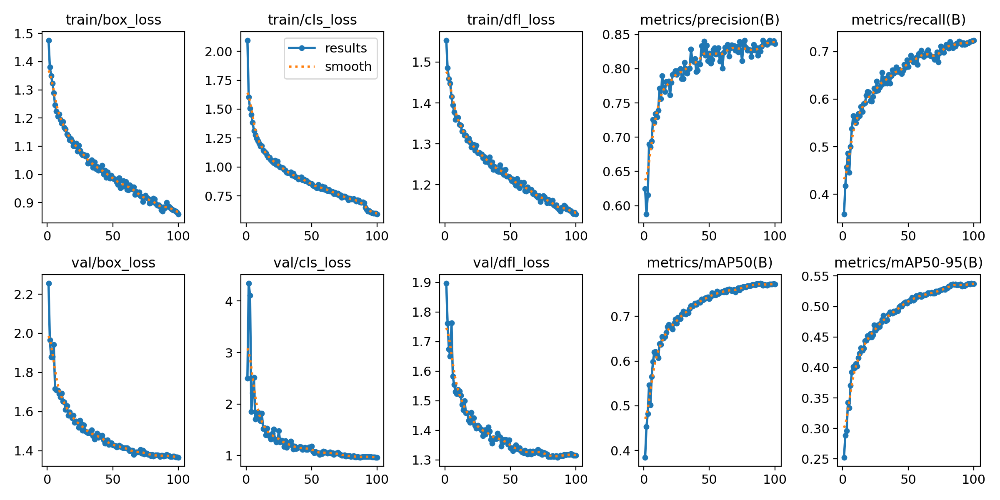

In [29]:
from IPython.display import Image

# Afficher le graphique des résultats
Image(filename=f'{results_dir}/{name}/results.png', width=800)


a. Perte d'entraînement et de validation
Perte décroissante : Une perte qui diminue de manière régulière indique que le modèle apprend.
Stagnation : Si la perte cesse de diminuer, le modèle peut avoir atteint sa convergence.
Surapprentissage (Overfitting) : Si la perte d'entraînement continue de diminuer tandis que la perte de validation stagne ou augmente, le modèle surapprend.

b. Précision et rappel
Augmentation : Une augmentation de la précision et du rappel sur l'ensemble de validation indique une amélioration des performances.
Stagnation ou diminution : Peut indiquer que le modèle n'apprend plus ou qu'il surapprend.

c. mAP50 et mAP50-95
mAP50 : Indique la précision du modèle à un seuil IoU de 0.5.
mAP50-95 : Moyenne de la précision sur des seuils IoU de 0.5 à 0.95.
Interprétation : Des valeurs élevées indiquent une bonne performance de détection.

In [30]:


destination = f'/content/drive/MyDrive/results_fire/{name}'

# Copier le dossier
shutil.copytree(results_dir, destination)


'/content/drive/MyDrive/results_fire/yolov8n_100_16_640_2024-09-25_enhanced'

## Test

### Test visuel sur dataset différent

In [33]:
# Chemin vers le modèle entraîné

model_path = f'/content/drive/MyDrive/results_fire/{name}/{name}/weights/best.pt'

# Charger le modèle
model = YOLO(model_path)


In [32]:
drive_test_images_path = '/content/drive/MyDrive/dataset/test_images'
test_images_path = '/content/test_images'

In [34]:

# Copier les images depuis Google Drive
shutil.copytree(drive_test_images_path, test_images_path)

'/content/test_images'

In [35]:
# Effectuer des prédictions

results = model.predict(source=test_images_path, save=True, save_txt=True)



image 1/10 /content/test_images/abc006.jpg: 640x640 2 fires, 7.4ms
image 2/10 /content/test_images/abc009 - Copie.jpg: 640x640 1 fire, 7.4ms
image 3/10 /content/test_images/abc023.jpg: 640x640 1 smoke, 7.3ms
image 4/10 /content/test_images/abc175.jpg: 640x640 4 fires, 7.3ms
image 5/10 /content/test_images/abc191.jpg: 640x640 1 fire, 8.5ms
image 6/10 /content/test_images/abc199.jpg: 640x640 (no detections), 7.4ms
image 7/10 /content/test_images/abc203.jpg: 640x640 (no detections), 7.4ms
image 8/10 /content/test_images/ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg: 640x640 1 smoke, 7.4ms
image 9/10 /content/test_images/ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg: 640x640 1 smoke, 7.4ms
image 10/10 /content/test_images/ck0kmfd7ibcib0721v08q1jv0_jpeg_jpg.rf.23b728dcffc3029baa5ad452d3b0f336.jpg: 640x640 1 smoke, 7.4ms
Speed: 2.0ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to r

['abc203.jpg', 'abc006.jpg', 'abc175.jpg', 'abc191.jpg', 'ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg', 'abc023.jpg', 'ck0kmfd7ibcib0721v08q1jv0_jpeg_jpg.rf.23b728dcffc3029baa5ad452d3b0f336.jpg', 'abc199.jpg', 'ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg', 'abc009 - Copie.jpg']


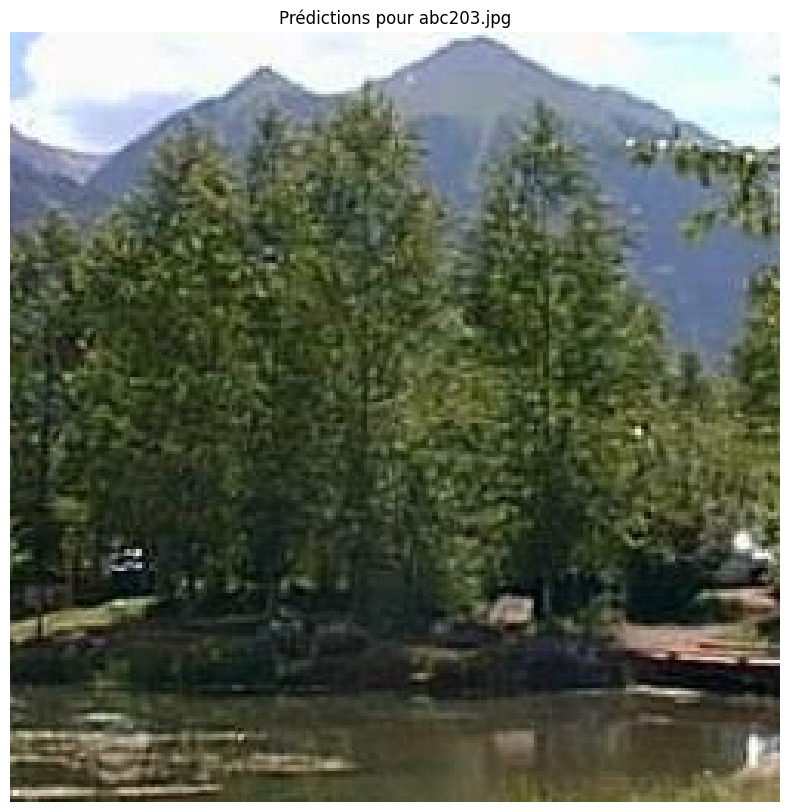

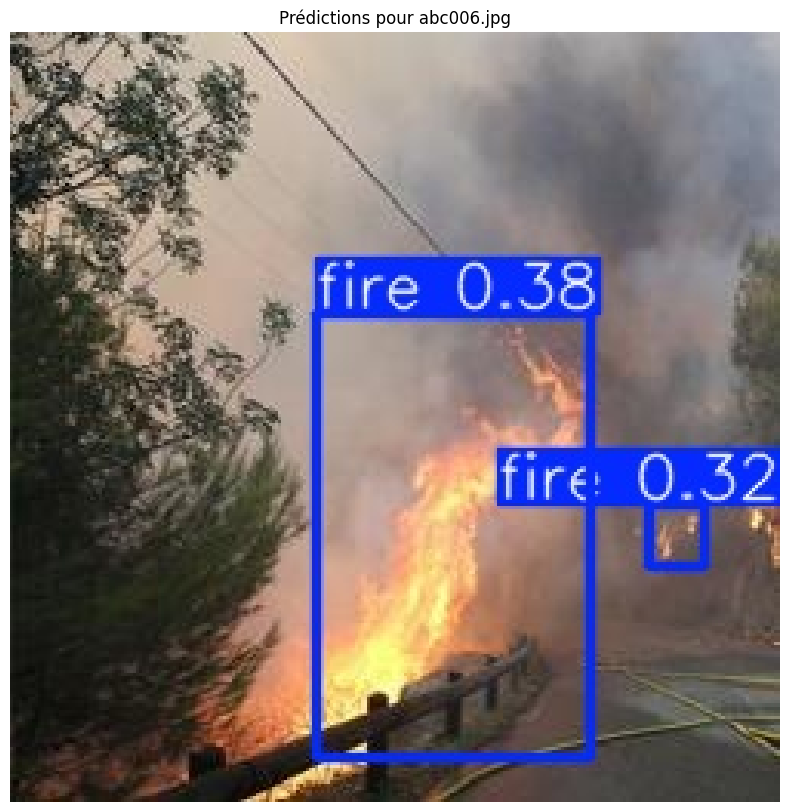

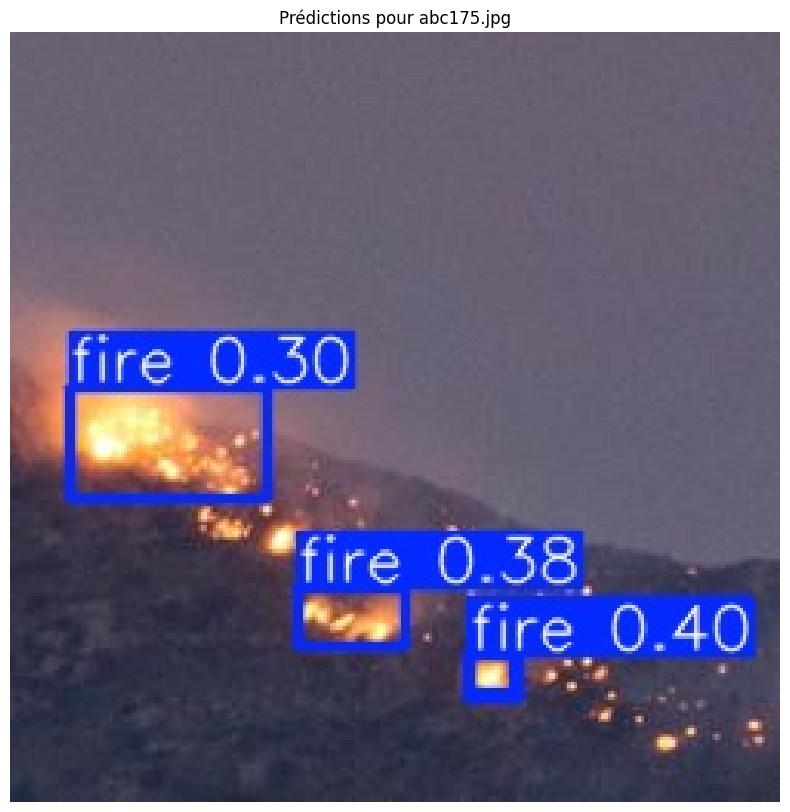

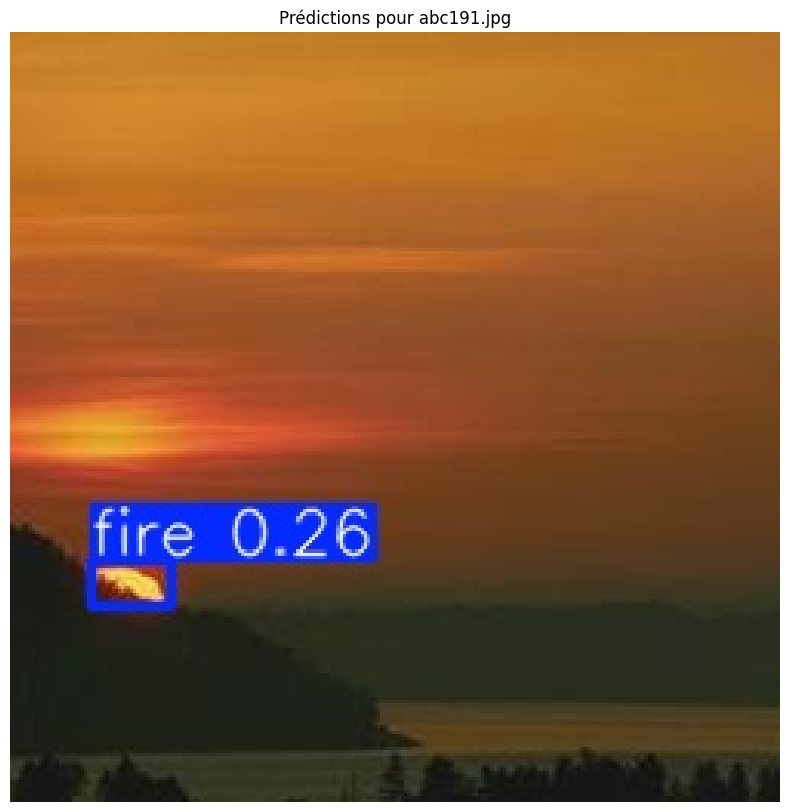

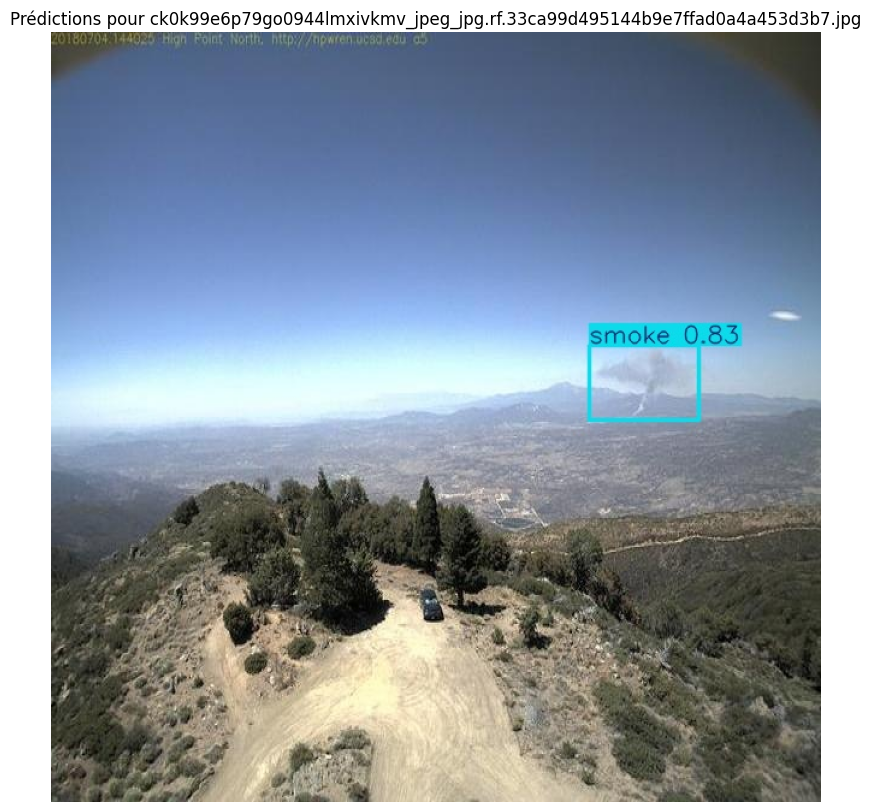

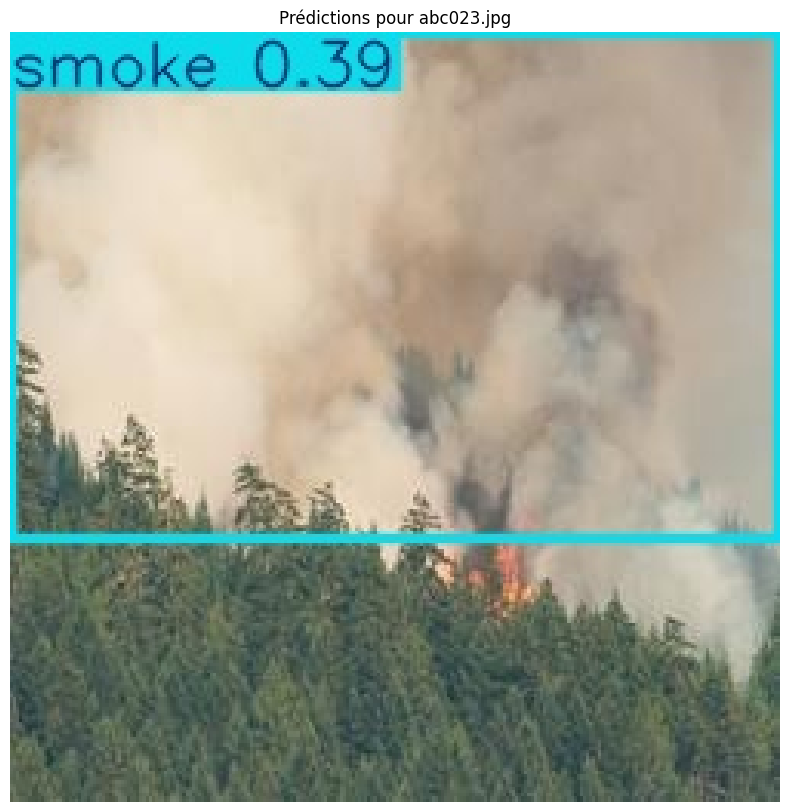

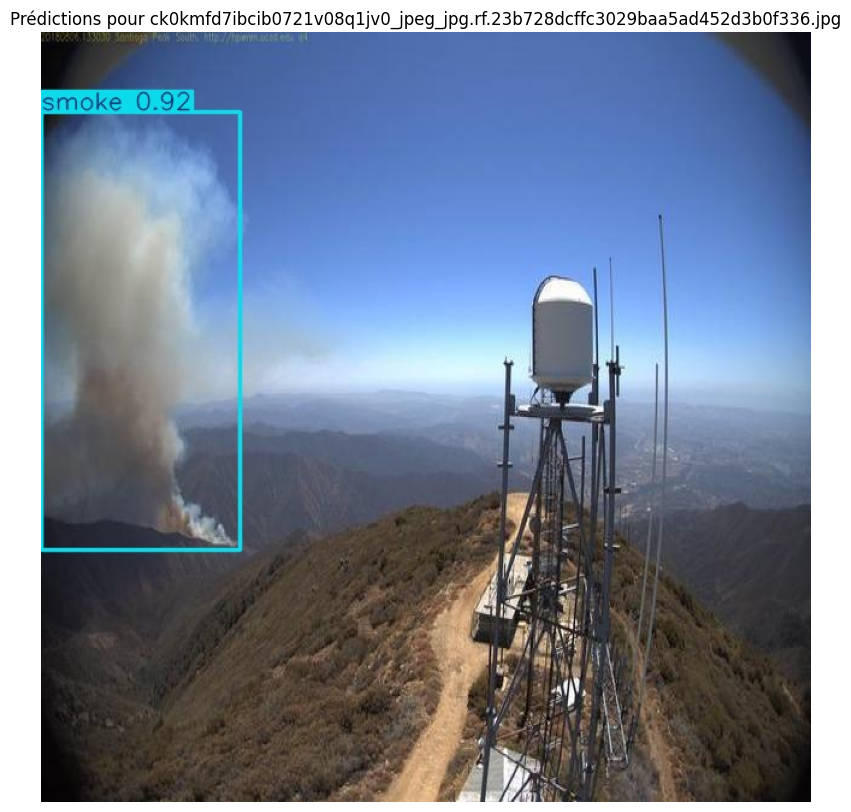

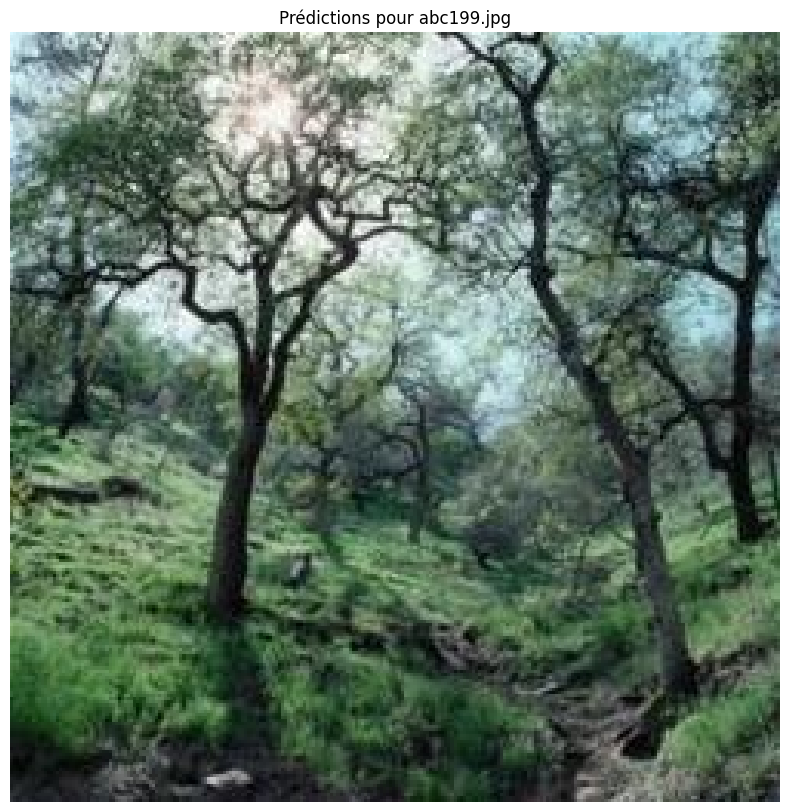

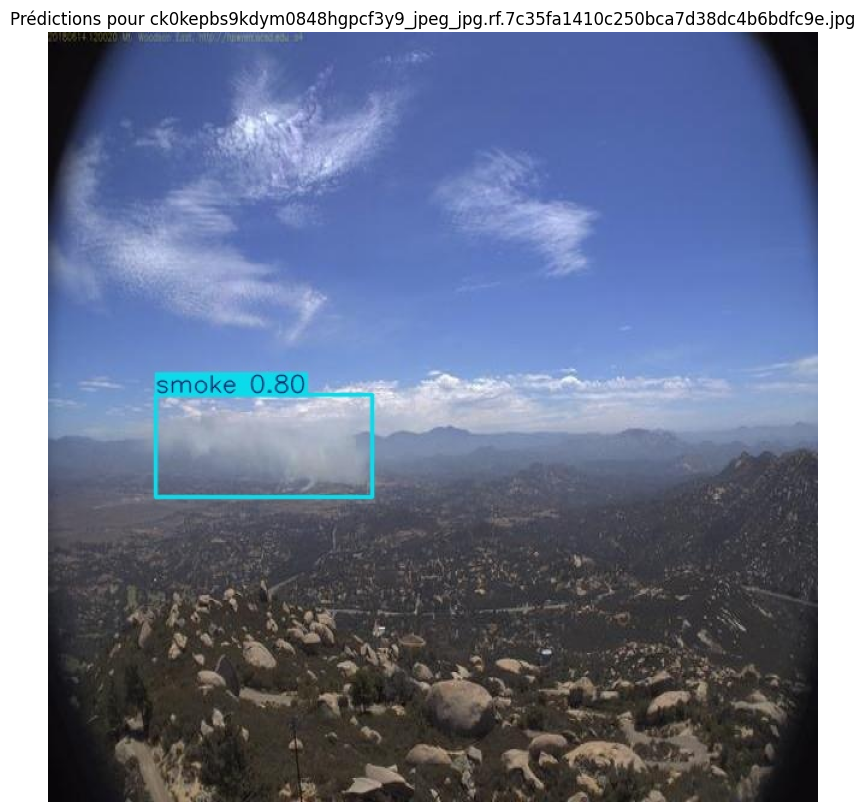

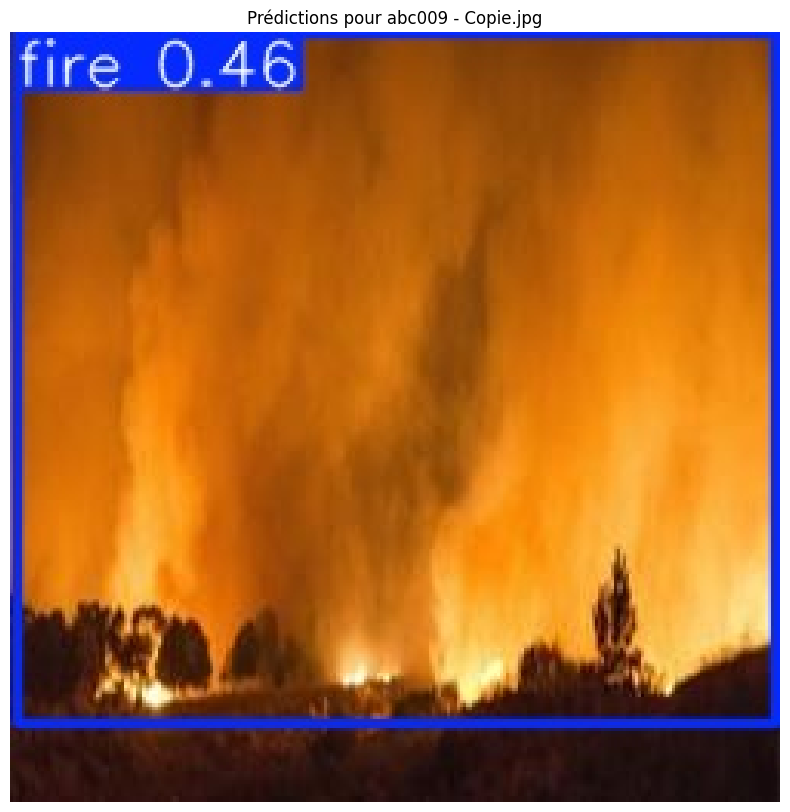

In [36]:
# Chemin vers le dossier où les images avec détections sont sauvegardées

predictions_dir = 'runs/detect/predict'

# Liste des images prédictes
predicted_images = os.listdir(predictions_dir)
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Lister uniquement les fichiers d'images et exclure les dossiers
predicted_images = [f for f in os.listdir(predictions_dir)
                    if os.path.isfile(os.path.join(predictions_dir, f)) and f.lower().endswith(image_extensions)]

print(predicted_images)
for img_name in predicted_images:
    img_path = os.path.join(predictions_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Prédictions pour {img_name}')
    plt.show()


### Test sur le dataset de test

In [37]:

# Obtenir les métriques de test
metrics = model.val(data=data_file_path)  # Remplacer par le chemin correct de vos données



Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/Fire_smoke_detectionyv8_plus/valid/labels.cache... 1601 images, 67 backgrounds, 0 corrupt: 100%|██████████| 1601/1601 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 12, len(boxes) = 2706. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:11<00:00,  8.51it/s]


                   all       1601       2706      0.817      0.685      0.754      0.517
                  fire        904       1545      0.832      0.755      0.816      0.582
                 smoke        941       1161      0.801      0.616      0.693      0.451
Speed: 0.2ms preprocess, 3.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val


In [38]:
# Affichage des métriques
print(metrics.box.map)
print(metrics.box.map50)
print(metrics.box.map75)
print(metrics.box.maps)


0.5166268618412585
0.75443330044388
0.5191147137194682
[    0.58178     0.45147]


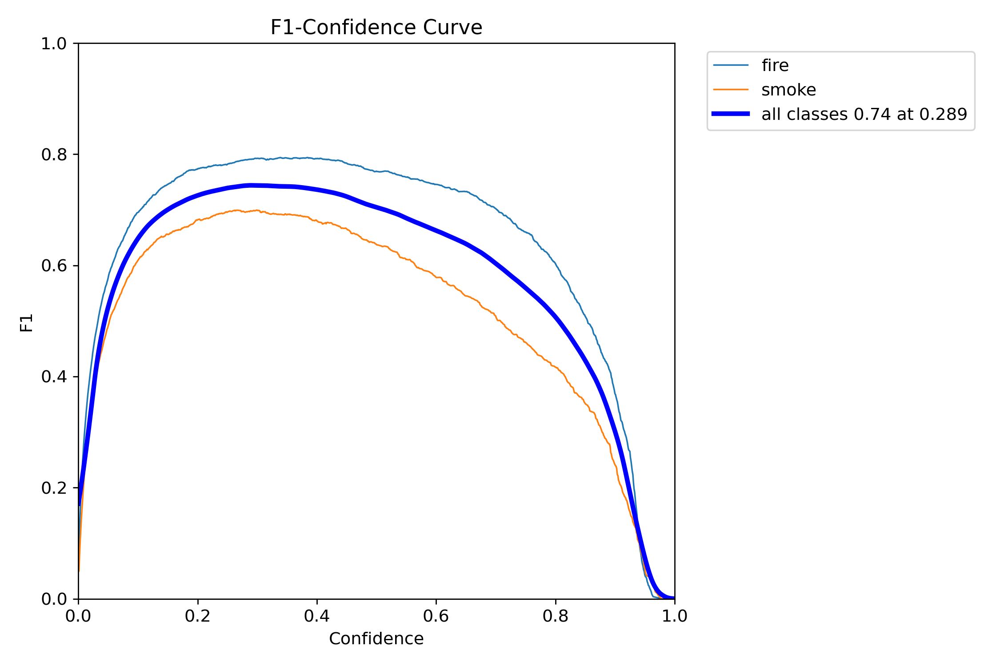

In [39]:
from IPython.display import Image

# Afficher le graphique des résultats
Image(filename='/content/runs/detect/val/F1_curve.png', width=800)


Max à 0.77 pour 0.3 de confiance

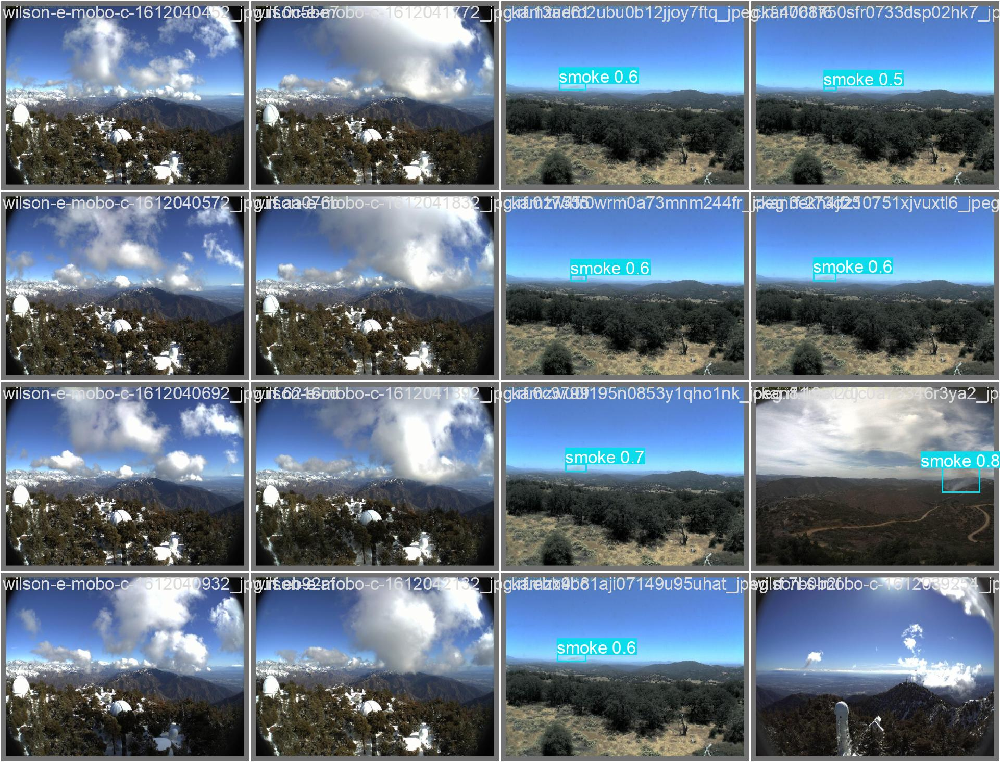

In [40]:
Image(filename='/content/runs/detect/val/val_batch0_pred.jpg', width=800)


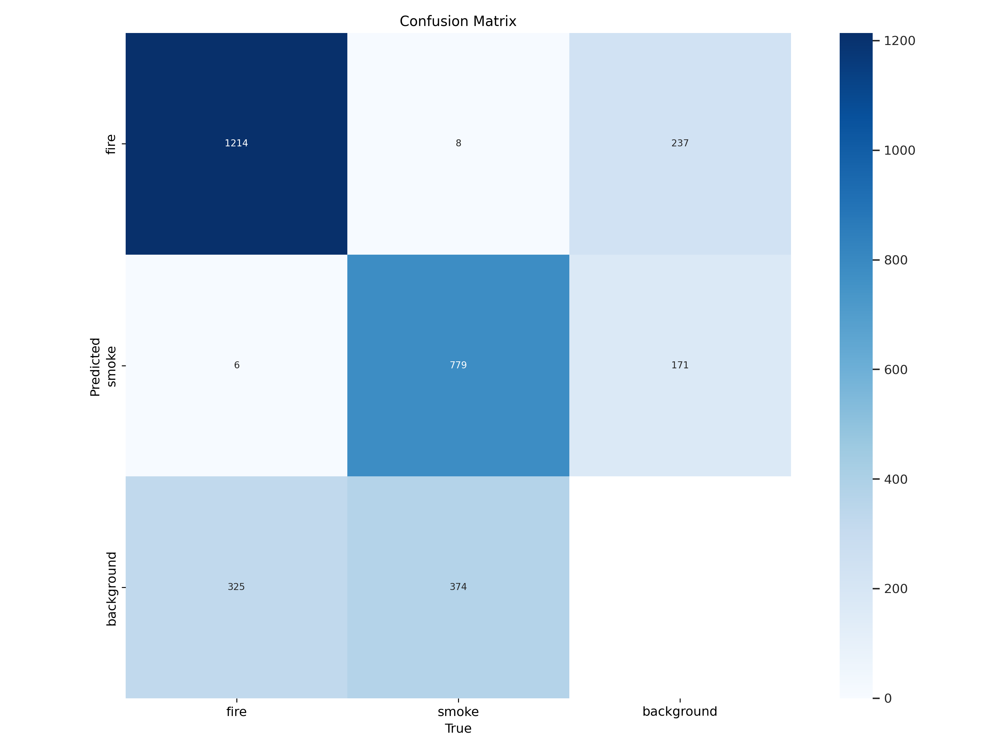

In [41]:
Image(filename='/content/runs/detect/val/confusion_matrix.png', width=800)


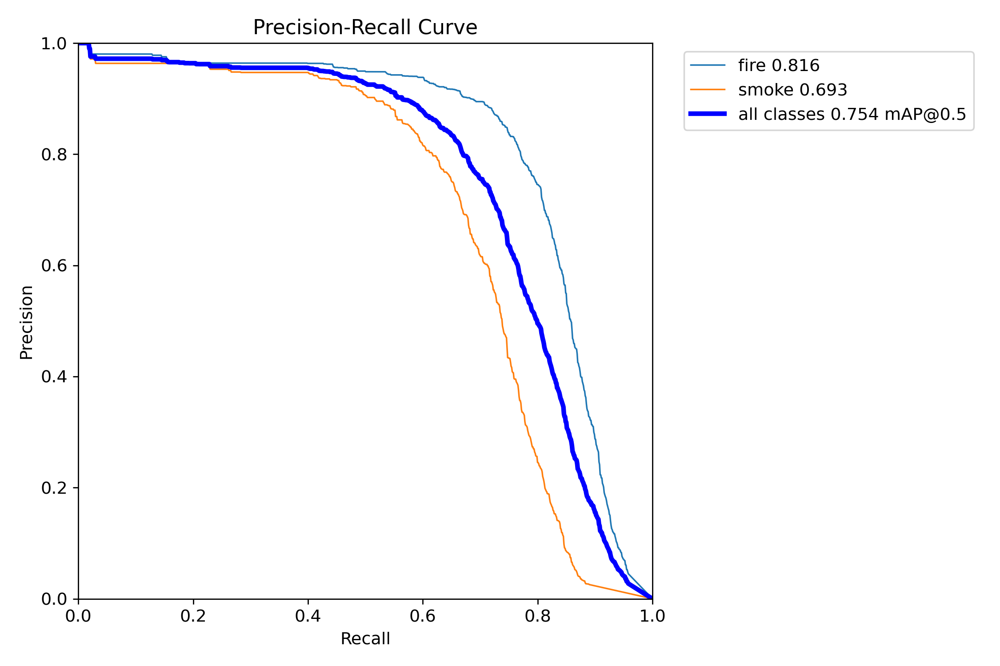

In [42]:
Image(filename='/content/runs/detect/val/PR_curve.png', width=800)


Mean Avergae Precision pour IOU=0.5 à 0.779

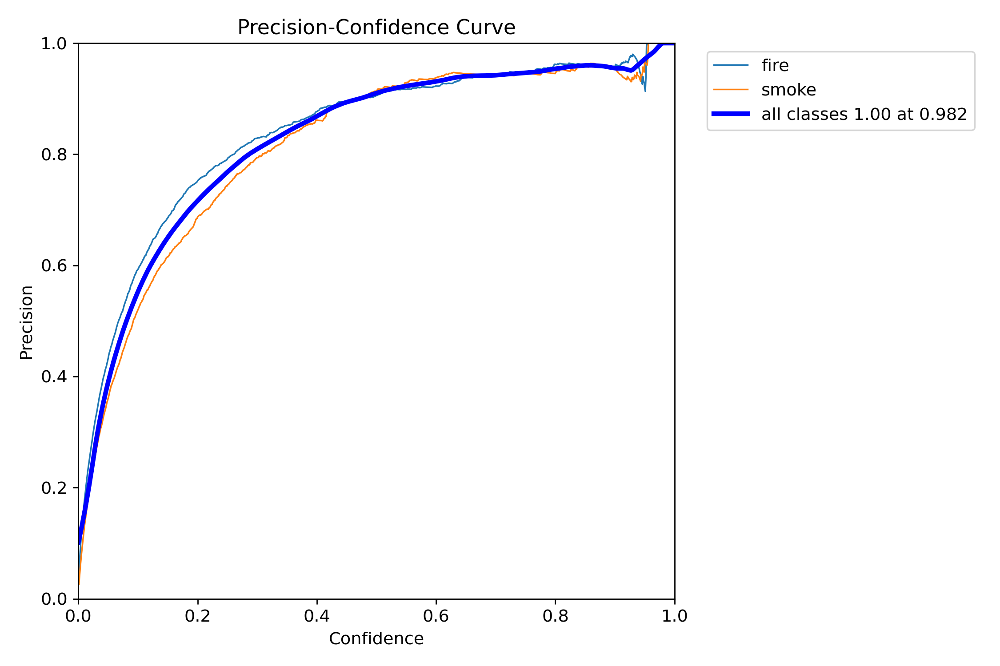

In [43]:
Image(filename='/content/runs/detect/val/P_curve.png', width=800)


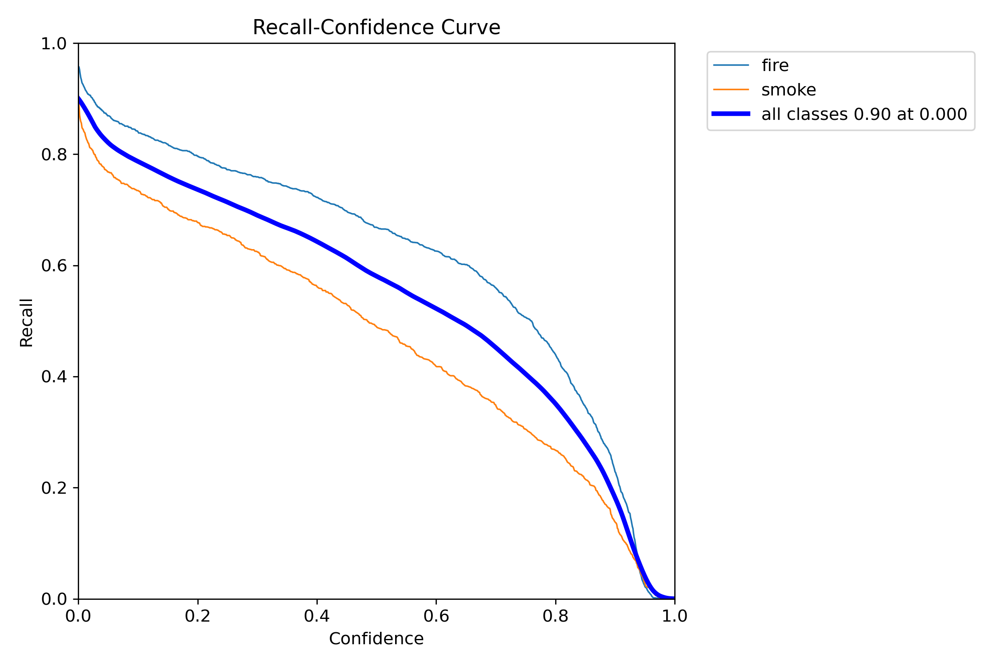

In [44]:
Image(filename='/content/runs/detect/val/R_curve.png', width=800)


### Conversion en TensorFlow Lite

In [45]:
model.export(format='tflite')

Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (6.0 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'onnx>=1.12.0', 'onnx2tf>1.17.5,<=1.22.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 297.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 182.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.3/140.3 kB 282.9 MB/s eta 0:00:

100%|██████████| 1.11M/1.11M [00:00<00:00, 131MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 51.92file/s]


ONNX: starting export with onnx 1.16.2 opset 19...


ONNX: slimming with onnxslim 0.1.34...
ONNX: export success ✅ 3.1s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best.onnx' (11.8 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 41.2s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model' (29.5 MB)

TensorFlow Lite: starting export with tensorflow 2.17.0...
TensorFlow Lite: export success ✅ 0.0s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite' (11.7 MB)

Export complete (42.7s)
Results saved to /content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights
Predict:         yolo predict task=detect model=/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights

'/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite'

In [46]:
model_tf = YOLO("/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.


Loading /content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite for TensorFlow Lite inference...

image 1/10 /content/test_images/abc006.jpg: 640x640 2 fires, 154.4ms
image 2/10 /content/test_images/abc009 - Copie.jpg: 640x640 1 fire, 148.0ms
image 3/10 /content/test_images/abc023.jpg: 640x640 1 smoke, 132.7ms
image 4/10 /content/test_images/abc175.jpg: 640x640 4 fires, 160.8ms
image 5/10 /content/test_images/abc191.jpg: 640x640 1 fire, 142.1ms
image 6/10 /content/test_images/abc199.jpg: 640x640 (no detections), 143.7ms
image 7/10 /content/test_images/abc203.jpg: 640x640 (no detections), 148.5ms
image 8/10 /content/test_images/ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg: 640x640 1 smoke, 154.9ms
image 9/10 /content/test_images/ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg: 640x640 1 smoke, 156.7ms
image 10/10 /content/test_images/ck0kmfd7ibcib0721

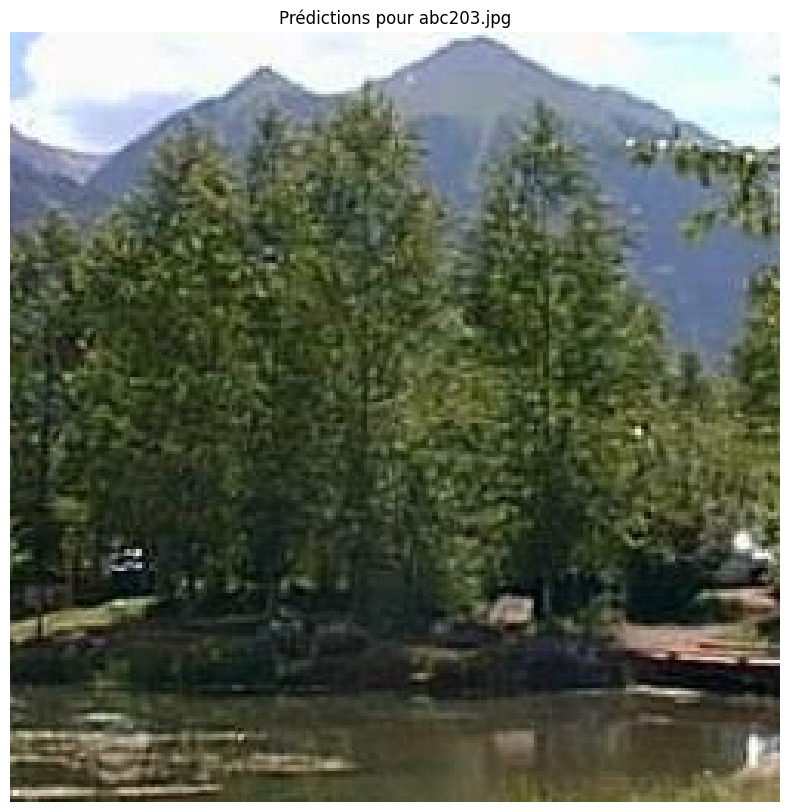

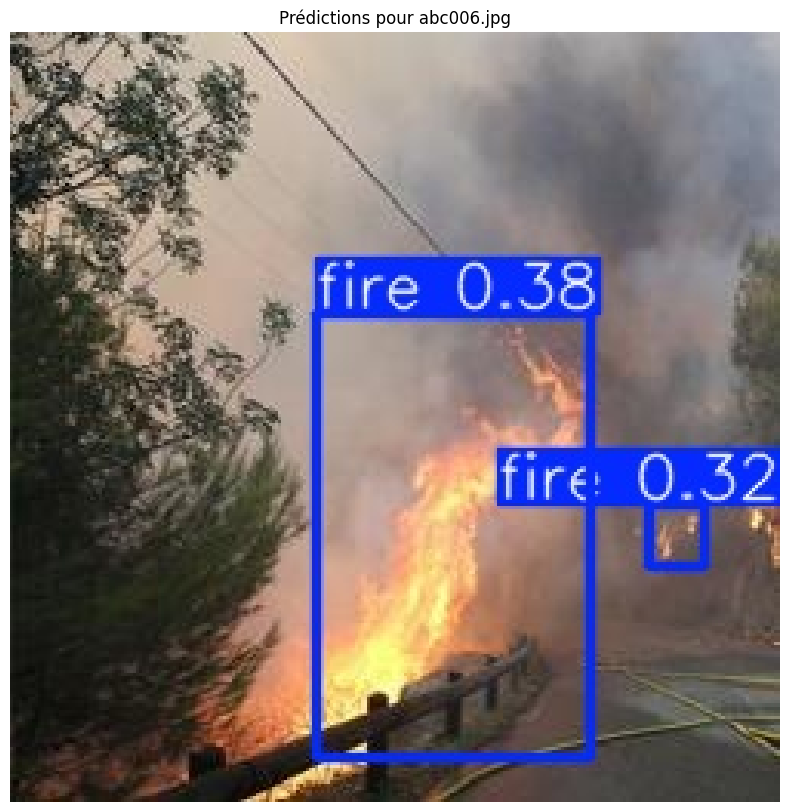

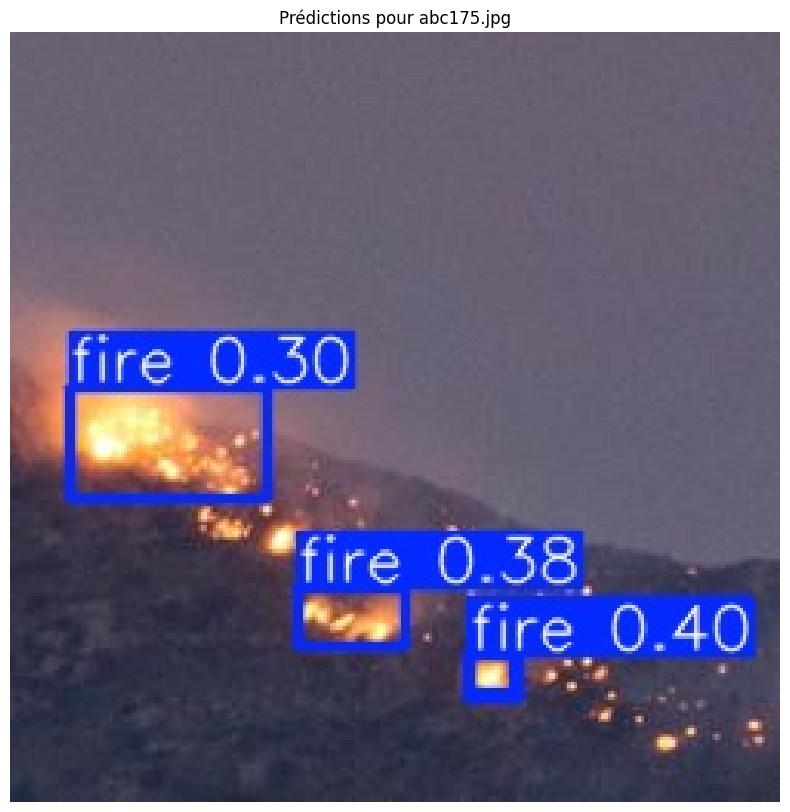

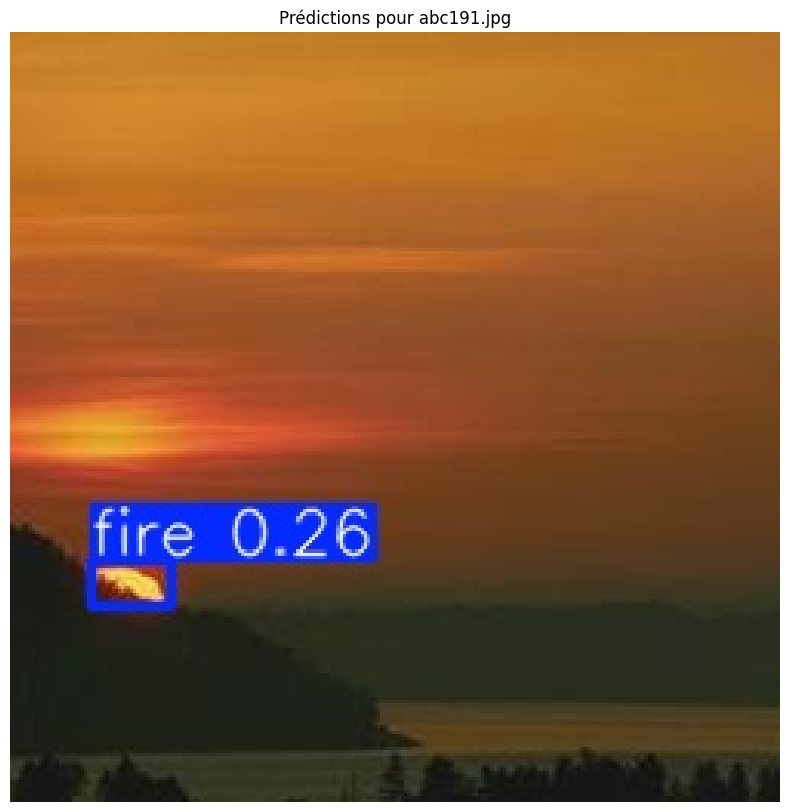

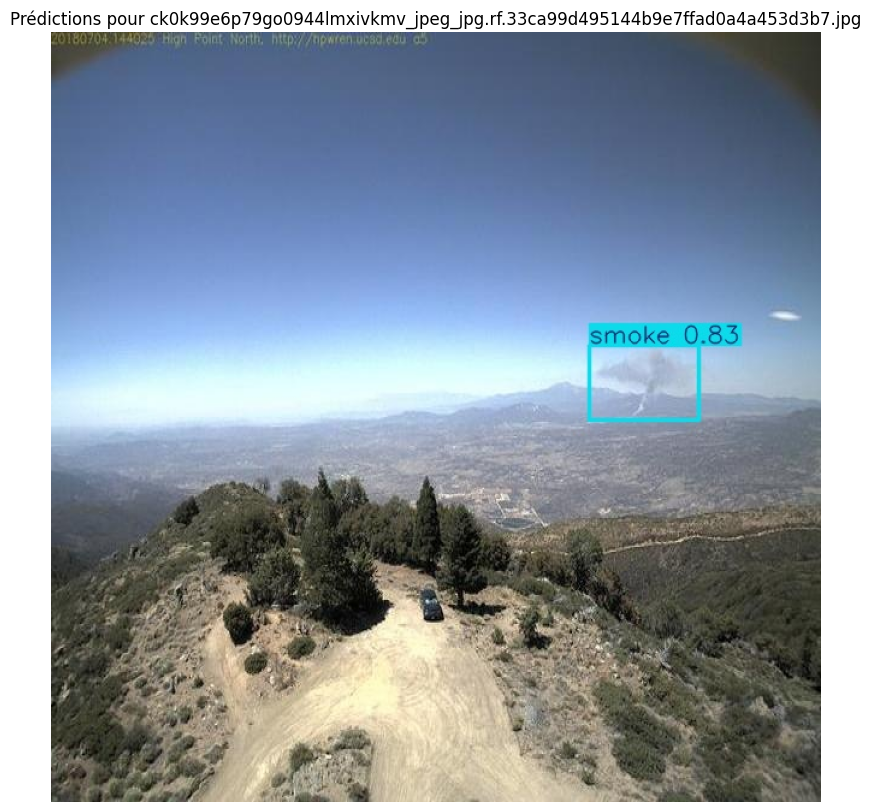

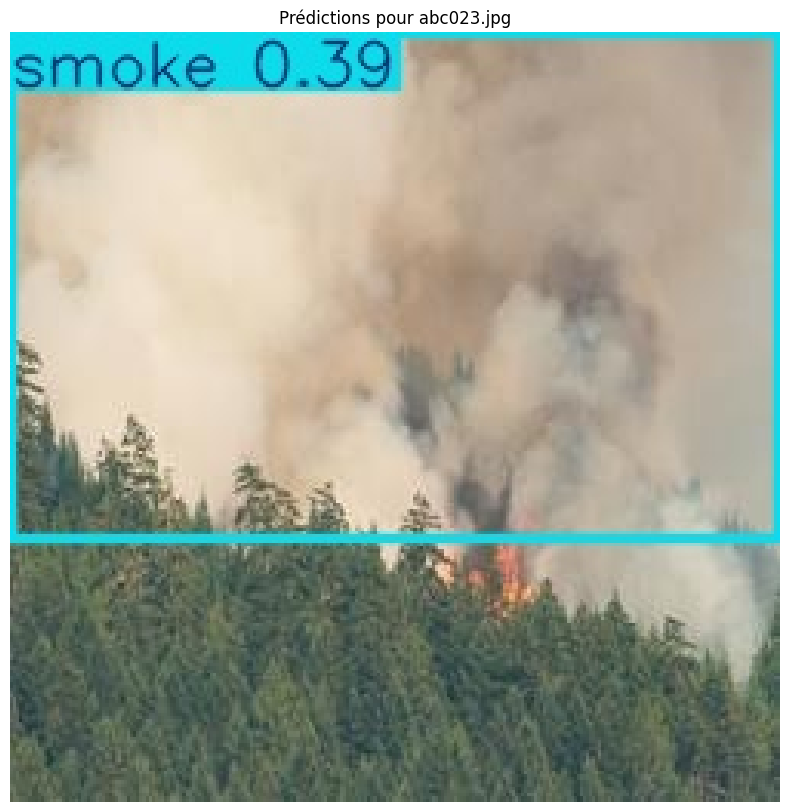

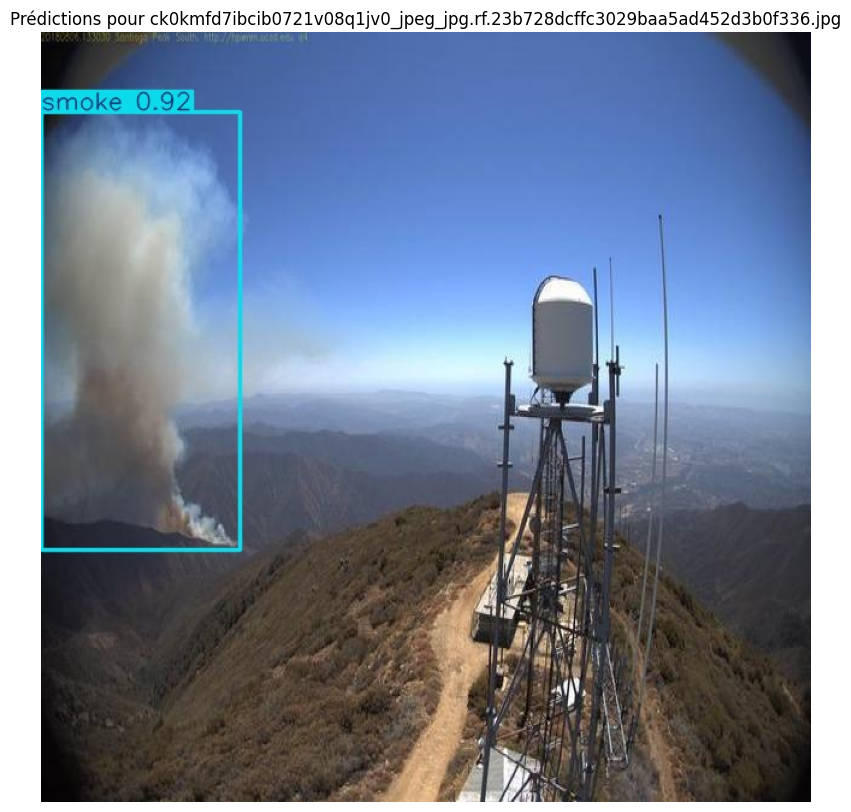

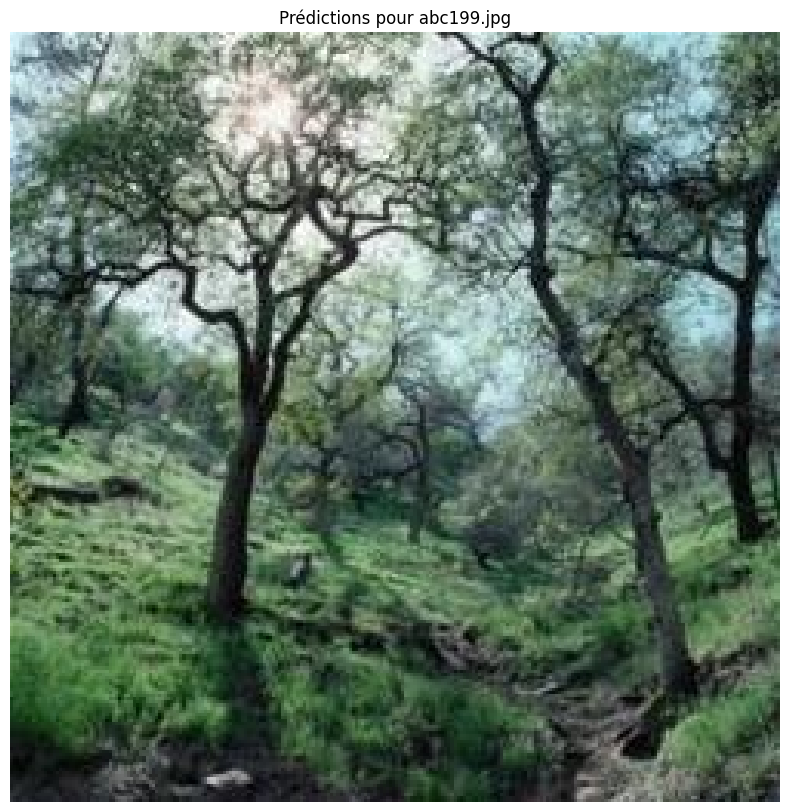

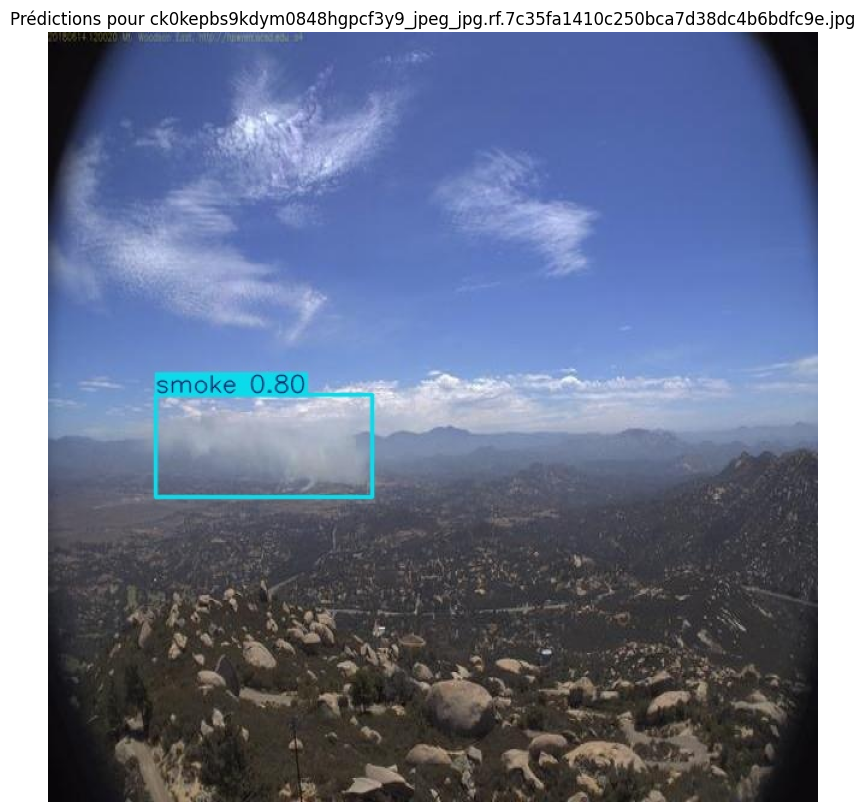

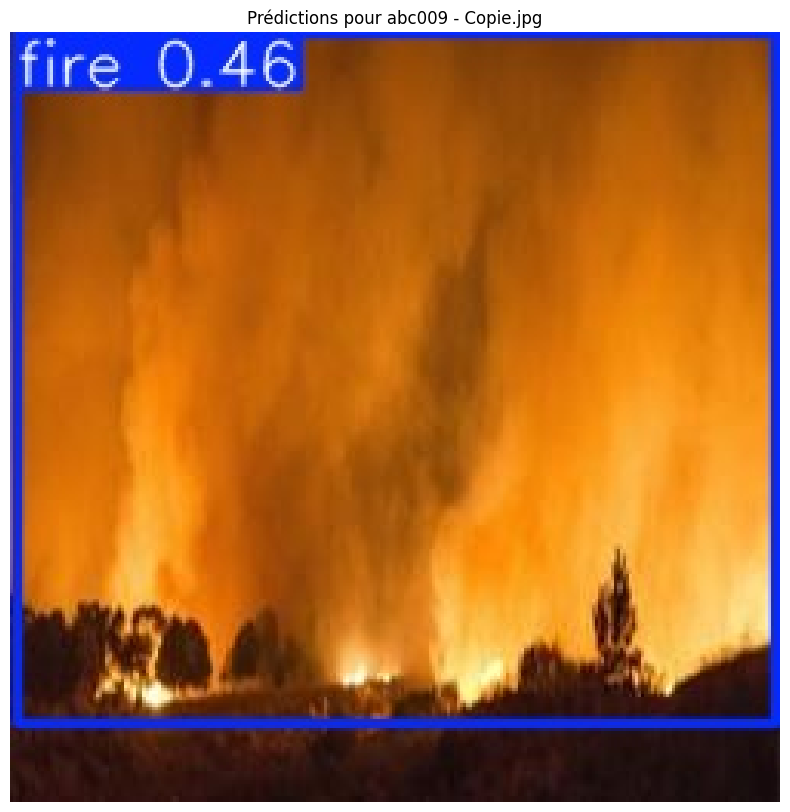

In [47]:
# Chemin vers le dossier où les images avec détections sont sauvegardées
results = model_tf.predict(source=test_images_path, save=True, save_txt=True)

predictions_dir = 'runs/detect/predict'

# Liste des images prédictes
predicted_images = os.listdir(predictions_dir)
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Lister uniquement les fichiers d'images et exclure les dossiers
predicted_images = [f for f in os.listdir(predictions_dir)
                    if os.path.isfile(os.path.join(predictions_dir, f)) and f.lower().endswith(image_extensions)]

print(predicted_images)
for img_name in predicted_images:
    img_path = os.path.join(predictions_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Prédictions pour {img_name}')
    plt.show()
